ISC 4551 Project: Eoin Corcoran

In [1]:
import re
import string
import spotipy
import requests
import numpy as np
import pandas as pd
from PIL import Image
import lyricsgenius as lg
import plotly.express as px
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from requests.exceptions import Timeout
from spotipy.oauth2 import SpotifyClientCredentials
from wordcloud import WordCloud, ImageColorGenerator
from nltk.stem import PorterStemmer, WordNetLemmatizer

C:\Users\eoinp\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
''' for presentation - resume at cell 17
df = pd.read_csv('taylorswift.csv')
'''

" for presentation - resume at cell 17\ndf = pd.read_csv('taylorswift.csv')\n"

### Getting song info using Spotify API

In [3]:
# connecting to Spotify API
cid = '0837abe0ed64411a9813a4fc85a06832'
sid = '145b1cae51c94789924ed7bc68b32d23'

creds = SpotifyClientCredentials(client_id = cid, client_secret = sid)
sp = spotipy.Spotify(client_credentials_manager = creds)

In [4]:
# URIs for the albums (no Taylor's Version/Deluxe Editions)
album_uri = ['spotify:album:7mzrIsaAjnXihW3InKjlC3', 'spotify:album:2dqn5yOQWdyGwOpOIi9O4x', 
             'spotify:album:5MfAxS5zz8MlfROjGQVXhy', 'spotify:album:1EoDsNmgTLtmwe1BDAVxV5',
             'spotify:album:2QJmrSgbdM35R67eoGQo4j', 'spotify:album:6DEjYFkNZh67HP7R9PSZvv',
             'spotify:album:1NAmidJlEaVgA3MpcPFYGq', 'spotify:album:2fenSS68JI1h4Fo296JfGr',
             'spotify:album:2Xoteh7uEpea4TohMxjtaq', 'spotify:album:151w1FgRZfnKZA9FEcg9Z3']

In [5]:
uris = []
names = []
album_names = []

# getting the track names and URIs for each track on each album
for uri in album_uri:
    for i in range(len(sp.album_tracks(uri)['items'])):
        uris.append(sp.album_tracks(uri)['items'][i]['uri'])
        names.append(sp.album_tracks(uri)['items'][i]['name'])
        album_names.append(sp.album(uri)['name'])

In [6]:
valence = []              # "muscial positiveness" of the song (0-1)
tempo = []                # speed of given song in beats per minute (BPM)
duration = []             # duration of track in milliseconds
danceability = []         # measure of how suitable track is for dancing using tempo, regularity, beat strength, etc. (0-1)
instrumentalness = []     # prediction of whether track contains no vocals (0-1)
energy = []               # perceptual measure of intensity and activity (0-1)
popularity = []           # popularity of song (0-100)

# collecting audio features for each song for later analysis
for uri in uris:
    valence.append(sp.audio_features(uri)[0]['valence'])
    tempo.append(sp.audio_features(uri)[0]['tempo'])
    duration.append(sp.audio_features(uri)[0]['duration_ms'])
    danceability.append(sp.audio_features(uri)[0]['danceability'])
    instrumentalness.append(sp.audio_features(uri)[0]['instrumentalness'])
    energy.append(sp.audio_features(uri)[0]['energy'])
    popularity.append(sp.track(uri)['popularity'])

In [7]:
# creating the data frame
df = pd.DataFrame(list(zip(names, album_names, valence, tempo, duration, danceability, instrumentalness, energy, popularity)),
        columns = ['track_name', 'album', 'valence', 'tempo', 'duration', 
                   'danceability', 'instrumentalness', 'energy', 'popularity'])

In [8]:
# cleaning up some of the data
df['track_name'] = df['track_name'].replace('Teardrops On My Guitar - Radio Single Remix', 'Teardrops On My Guitar')
df.drop(14, axis = 0, inplace = True) # different version of another song - not needed
df['duration'] = df['duration'] / 1000 # converting duration to seconds from milliseconds
df

,track_name,album,valence,tempo,duration,danceability,instrumentalness,energy,popularity
0,Tim McGraw,Taylor Swift,0.4250,76.009,232.107,0.580,0.000000,0.491,70
1,Picture To Burn,Taylor Swift,0.8210,105.586,173.067,0.658,0.000000,0.877,72
2,Teardrops On My Guitar,Taylor Swift,0.2890,99.953,203.040,0.621,0.000000,0.417,69
3,A Place in this World,Taylor Swift,0.4280,115.028,199.200,0.576,0.000000,0.777,60
4,Cold As You,Taylor Swift,0.2610,175.558,239.013,0.418,0.000000,0.482,60
...,...,...,...,...,...,...,...,...,...
143,Bejeweled,Midnights,0.4330,163.999,194.166,0.696,0.000056,0.559,84
144,Labyrinth,Midnights,0.1220,110.014,247.962,0.406,0.488000,0.306,78
145,Karma,Midnights,0.0969,90.020,204.852,0.642,0.000000,0.620,85
146,Sweet Nothing,Midnights,0.3900,176.655,188.497,0.337,0.000077,0.156,78


### Getting lyrics from Genius using lyricsgenius API

In [9]:
file = open('auto_.txt', 'w')

In [10]:
# connecting to lyricsgenius API
genius = lg.Genius('9DOmac8Wy5JqdDwjQMQc_71QMMi1cQAybNQZad3neJYoo3wWtk7kRgRScQBMvNqW',
                   skip_non_songs = True, remove_section_headers = True)

In [11]:
# printing a song's lyrics to check for things to fix
testlyrics = genius.lyrics(song_url = 'https://genius.com/Taylor-swift-lavender-haze-lyrics')
print(testlyrics)

99 ContributorsTranslationsEspañolFrançaisPortuguês中文СрпскиMagyarItalianoУкраїнськаTürkçeNederlandsSvenskaDeutschMagyarΕλληνικάLavender Haze Lyrics
Meet me at midnight

Staring at the ceiling with you
Oh, you don't ever say too much
And you don't really read into
My melancholia

I been under scrutiny (Yeah, oh, yeah)
You handle it beautifully (Yeah, oh, yeah)
All this shit is new to me (Yeah, oh, yeah)
I feel
The lavender haze creeping up on me
Surreal
I'm damned if I do give a damn what people say
No deal
The 1950s shit they want from me
I just wanna stay in that lavender haze

All they keep asking me (All they keep asking me)
Is if I'm gonna be your bride
The only kinda girl they see (Only kinda girl they see)
Is a one-night or a wife

I find it dizzying (Yeah, oh, yeah)
They're bringing up my history (Yeah, oh, yeah)
But you weren't even listening (Yeah, oh, yeah)

I feel
The lavender haze creepin' up on me
Surreal
I'm damned if I do give a damn what people say
No deal
The 1950s shi

In [12]:
# creating genius.com url using the song name to get lyrics from
def url_maker(song):
    # cleaning up the song name to fit genius format in url
    song = re.sub(r'\([feat]+.+\)+', '', song).strip()
    song = song.replace('&', 'and').replace('’', '').replace('‘', '').replace('-', ' ')
    song = song.translate(str.maketrans('', '', string.punctuation))
    song = str(song.replace(' ', '-')).lower()
    url = 'https://genius.com/Taylor-swift-' + song + '-lyrics'
    
    return url

In [13]:
# removing unnecessary information from obtained lyrics
def clean_lyrics(lyrics):
    lyrics = re.sub(r'Translations.+\n', '', lyrics)
    lyrics = re.sub(r'See.+\n', '', lyrics)
    lyrics = re.sub(r'\d.+', '', lyrics)
    lyrics = re.sub(r'\n', ' ', lyrics)
    
    return lyrics

In [14]:
# fetching lyrics for a song using lyricsgenius API
def get_lyrics(song):
    url = url_maker(song)
    
    try:
        lyrics = genius.lyrics(song_url = url)
    except Timeout as e:
        lyrics = get_lyrics(url)
    
    lyrics = clean_lyrics(lyrics)
    return lyrics

In [15]:
# creating list of song names to iterate through
songs = df['track_name'].tolist()
lyrics = []

genius.timeout = 15
genius.sleep_time = 0

# getting the lyrics for each song with lyricsgenius API
for song in songs:
    lyrics.append(get_lyrics(song))

In [16]:
# adding lyrics to dataframe
df['lyrics'] = lyrics

In [17]:
# adding word count of song to dataframe
wordcounts = []
for i in range(len(df)):
    lyrics = df.iloc[i]['lyrics'].split()
    wordcounts.append(len(lyrics))

df['word_count'] = wordcounts

In [18]:
df

,track_name,album,valence,tempo,duration,danceability,instrumentalness,energy,popularity,lyrics,word_count
0,Tim McGraw,Taylor Swift,0.4250,76.009,232.107,0.580,0.000000,0.491,70,Put those Georgia stars to shame that night I...,358
1,Picture To Burn,Taylor Swift,0.8210,105.586,173.067,0.658,0.000000,0.877,72,I realize you love yourself more than you cou...,282
2,Teardrops On My Guitar,Taylor Swift,0.2890,99.953,203.040,0.621,0.000000,0.417,69,"I fake a smile, so he won't see That I want a...",284
3,A Place in this World,Taylor Swift,0.4280,115.028,199.200,0.576,0.000000,0.777,60,'Cause I'm still trying to figure it out Don'...,230
4,Cold As You,Taylor Swift,0.2610,175.558,239.013,0.418,0.000000,0.482,60,"And when you take, you take the very best of ...",245
...,...,...,...,...,...,...,...,...,...,...,...
143,Bejeweled,Midnights,0.4330,163.999,194.166,0.696,0.000056,0.559,84,Didn't notice you walkin' all over my peace o...,416
144,Labyrinth,Midnights,0.1220,110.014,247.962,0.406,0.488000,0.306,78,Was what I was thinkin' the whole time Breath...,250
145,Karma,Midnights,0.0969,90.020,204.852,0.642,0.000000,0.620,85,"Addicted to betrayal, but you're relevant You...",375
146,Sweet Nothing,Midnights,0.3900,176.655,188.497,0.337,0.000077,0.156,78,Tiny as a firefly A pebble that we picked up ...,270


### Visualizing the data

In [19]:
# plotting popularity across songs and albums
colorDict = {'Taylor Swift':'#00e5ff', 'Fearless':'#caab71', 'Speak Now':'#6a329f', 
             'Red':'#d41b0d', '1989':'#233bc2', 'reputation':'#000000', 'Lover':'#e300fa', 
             'folklore':'#999999', 'evermore':'#994914', 'Midnights':'#395a57'}

fig = px.line(df, y = 'popularity', color = 'album', color_discrete_map = colorDict, hover_name = 'track_name',
              markers = 'o')

# adding annotations for most popular song in each album (and least popular song)
fig.add_annotation(x = 10, y = 75, text = 'Our Song', showarrow = True, arrowhead = 1)
fig.add_annotation(x = 20, y = 72, text = 'You Belong With Me', showarrow = True, arrowhead = 1, ax = -10, ay = -90)
fig.add_annotation(x = 36, y = 79, text = 'Enchanted', showarrow = True, arrowhead = 1)
fig.add_annotation(x = 45, y = 65, text = 'I Knew You Were Trouble.', showarrow = True, arrowhead = 1, ax = 150, ay = 85)
fig.add_annotation(x = 56, y = 41, text = 'Starlight', showarrow = True, arrowhead = 1, ax = 50, ay = 5)
fig.add_annotation(x = 59, y = 81, text = 'Blank Space', showarrow = True, arrowhead = 1)
fig.add_annotation(x = 74, y = 89, text = 'Don\'t Blame Me', showarrow = True, arrowhead = 1, ax = -15)
fig.add_annotation(x = 87, y = 89, text = 'Cruel Summer', showarrow = True, arrowhead = 1, ax = 35)
fig.add_annotation(x = 105, y = 88, text = 'cardigan', showarrow = True, arrowhead = 1, ax = 25, ay = -15)
fig.add_annotation(x = 121, y = 81, text = 'champagne problems', showarrow = True, arrowhead = 1, ay = 120)
fig.add_annotation(x = 137, y = 95, text = 'Anti-Hero', showarrow = True, arrowhead = 1)

fig.show()

In [20]:
# plotting danceability against valence for each album
fig = px.scatter(df, x = 'danceability', y = 'valence', size = 'word_count', facet_col = 'album', color = 'album',
                 hover_name = 'track_name', color_discrete_map = colorDict, facet_col_wrap = 3)

# retrieving pictures for use in plots
covers = ['https://upload.wikimedia.org/wikipedia/en/thumb/9/9f/Midnights_-_Taylor_Swift.png/220px-Midnights_-_Taylor_Swift.png',
          'https://upload.wikimedia.org/wikipedia/en/thumb/c/cd/Taylor_Swift_-_Lover.png/220px-Taylor_Swift_-_Lover.png',
          'https://upload.wikimedia.org/wikipedia/en/thumb/f/f8/Taylor_Swift_-_Folklore.png/220px-Taylor_Swift_-_Folklore.png',
          'https://upload.wikimedia.org/wikipedia/en/thumb/0/0a/Taylor_Swift_-_Evermore.png/220px-Taylor_Swift_-_Evermore.png',
          'https://upload.wikimedia.org/wikipedia/en/thumb/4/47/Taylor_Swift_-_Red_%28Taylor%27s_Version%29.png/220px-Taylor_Swift_-_Red_%28Taylor%27s_Version%29.png', 
          'https://upload.wikimedia.org/wikipedia/en/thumb/f/f6/Taylor_Swift_-_1989.png/220px-Taylor_Swift_-_1989.png', 
          'https://upload.wikimedia.org/wikipedia/en/thumb/f/f2/Taylor_Swift_-_Reputation.png/220px-Taylor_Swift_-_Reputation.png', 
          'https://upload.wikimedia.org/wikipedia/en/thumb/1/1f/Taylor_Swift_-_Taylor_Swift.png/220px-Taylor_Swift_-_Taylor_Swift.png',
          'https://upload.wikimedia.org/wikipedia/en/thumb/5/5b/Fearless_%28Taylor%27s_Version%29_%282021_album_cover%29_by_Taylor_Swift.png/220px-Fearless_%28Taylor%27s_Version%29_%282021_album_cover%29_by_Taylor_Swift.png', 
          'https://upload.wikimedia.org/wikipedia/en/thumb/8/8f/Taylor_Swift_-_Speak_Now_cover.png/220px-Taylor_Swift_-_Speak_Now_cover.png', ]

i = 1
j = 1

# adding images to the subplots
for img in covers:
    fig.add_layout_image(
        row = i,
        col = j,
        source = img,
        xref = "x domain",
        yref = "y domain",
        x = 1,
        y = 1,
        xanchor = "right",
        yanchor = "top",
        sizex = 0.4,
        sizey = 0.4,
    )
    
    if i == 1 or j == 3:
        i += 1
        j = 1
    else:
        j += 1
        
fig.show()

In [21]:
# creating dataframe for lyrics for easier access
lyrics_df = pd.DataFrame(index = df['album'].unique(), columns = ['lyrics'])

# grouping all song lyrics together by album for word clouds
for album in list(lyrics_df.index):
    L = ''
    for i in range(len(df)):
        if df.iloc[i]['album'] == album:
            L = ''.join([L, df.iloc[i]['lyrics']])
    lyrics_df.loc[album] = L
    
lyrics_df

,lyrics
Taylor Swift,Put those Georgia stars to shame that night I...
Fearless,The street looks when it's just rained There'...
Speak Now,"Oh-oh, oh-oh You were in college working par..."
Red,Busy streets and busy lives And all we know i...
1989,Kaleidoscope of loud heartbeats under coats E...
reputation,Wondered how many girls he had loved and left...
Lover,"'Bout how you did me wrong, wrong, wrong? Liv..."
folklore,"Been saying ""yes"" instead of ""no"" I thought I..."
evermore,"Rough on the surface, but you cut through lik..."
Midnights,"Staring at the ceiling with you Oh, you don'..."


In [22]:
# cleaning up lyrics
lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer()

# removing punctuation, lemmatizing, and putting lyrics into lowercase
for album in list(lyrics_df.index):
    mess = lyrics_df.loc[album]['lyrics']
    mess = [char for char in mess if char not in string.punctuation]
    mess = ''.join(mess)
    
    words = word_tokenize(mess)
    words = [lemmatizer.lemmatize(w.lower()) for w in words] # words to lemma (dictionary form) (was -> be)
    
    lyrics_df.loc[album]['lyrics'] = ' '.join(words)

In [23]:
# creating stopword list and adding any additional words
mess = list(stopwords.words('english'))
mess = ' '.join(mess)
mess = [char for char in mess if char not in string.punctuation]

# adding additional words that were too frequent
stopwordsList = word_tokenize(''.join(mess))
stopwordsList.append('na')
stopwordsList.append('oh')
stopwordsList.append('wa')
stopwordsList.append('im')
stopwordsList.append('wan')
stopwordsList.append('like')
stopwordsList.append('know')
stopwordsList.append('would')
stopwordsList.append('yeah')
stopwordsList.append('ohoh')


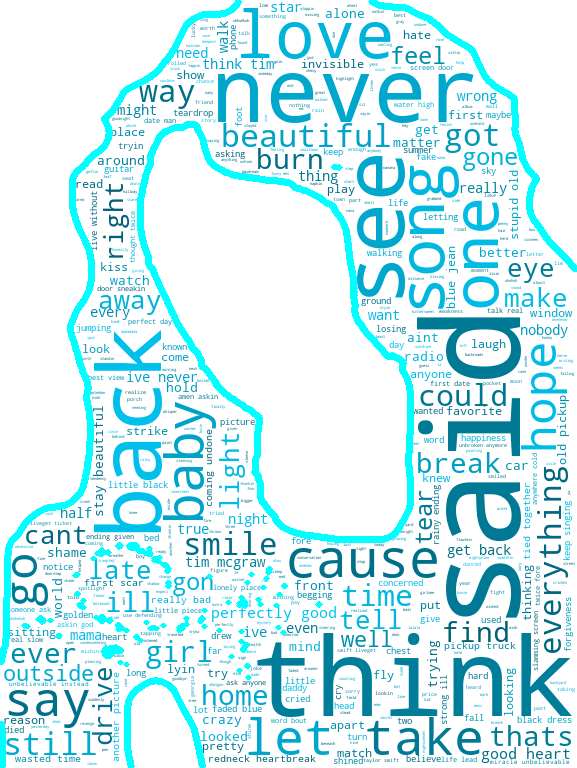

In [24]:
# creating word clouds for each album with mask in style of album cover
debut_mask = np.array(Image.open('debut.png'))

# coloring function for the words to match album style
def debut_col(word, font_size, position, orientation, font_path, random_state = None):
    h = 191
    s = 100
    l = int(100.0 * float(random_state.randint(60, 120)) / 255.0)

    return "hsl({}, {}%, {}%)".format(h, s, l)

word_cloud = WordCloud(mask = debut_mask, stopwords = stopwordsList, contour_color = 'cyan', contour_width = 10,
                       background_color = 'white', max_words = 1000).generate(lyrics_df.loc['Taylor Swift']['lyrics'])

fig = px.imshow(word_cloud.recolor(color_func = debut_col, random_state = 13))
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(showticklabels = False)


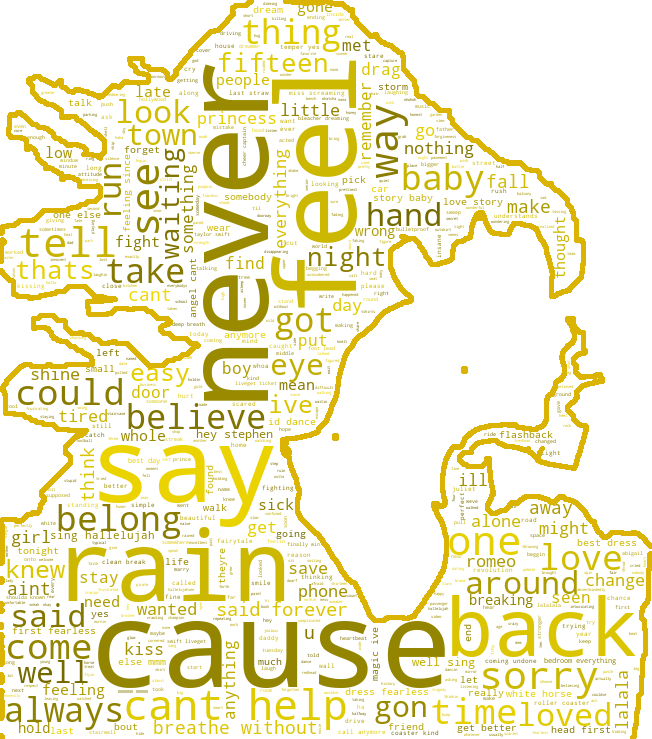

In [25]:
fearless_mask = np.array(Image.open('fearless.png'))

def fearless_col(word, font_size, position, orientation, font_path, random_state = None):
    h = 54
    s = 100
    l = int(100.0 * float(random_state.randint(60, 120)) / 255.0)

    return "hsl({}, {}%, {}%)".format(h, s, l)

word_cloud = WordCloud(mask = fearless_mask, stopwords = stopwordsList, contour_color = '#dbb302', contour_width = 8,
                       background_color = 'white', max_words = 1000).generate(lyrics_df.loc['Fearless']['lyrics'])

fig = px.imshow(word_cloud.recolor(color_func = fearless_col, random_state = 13))
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(showticklabels = False)


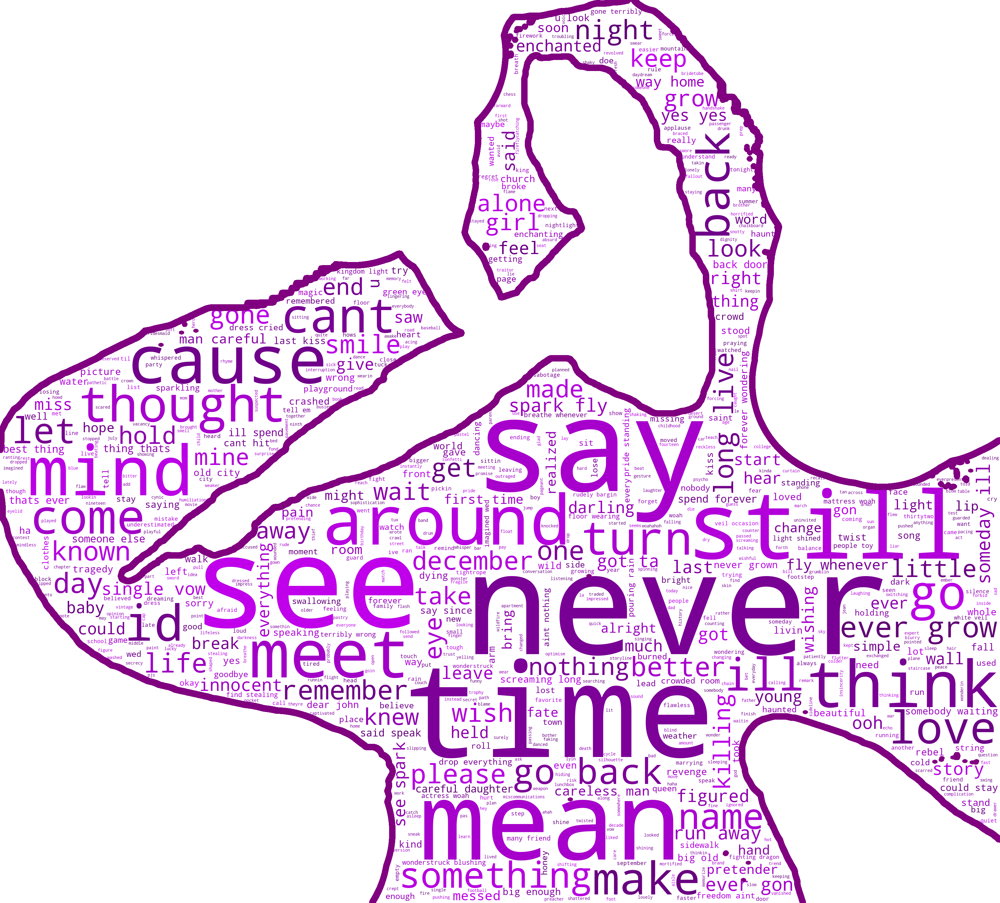

In [26]:
sn_mask = np.array(Image.open('speaknow.png'))

def sn_col(word, font_size, position, orientation, font_path, random_state = None):
    h = 289
    s = 100
    l = int(100.0 * float(random_state.randint(60, 120)) / 255.0)

    return "hsl({}, {}%, {}%)".format(h, s, l)

word_cloud = WordCloud(mask = sn_mask, stopwords = stopwordsList, contour_color = 'purple', contour_width = 40,
                       background_color = 'white', max_words = 1000).generate(lyrics_df.loc['Speak Now']['lyrics'])

fig = px.imshow(word_cloud.recolor(color_func = sn_col, random_state = 13))
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(showticklabels = False)


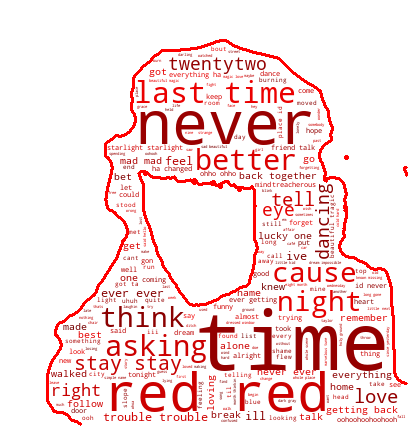

In [27]:
red_mask = np.array(Image.open('red.png'))

def red_col(word, font_size, position, orientation, font_path, random_state = None):
    h = int(360.0 * 255 / 255.0)
    s = int(100.0 * 255 / 255.0)
    l = int(100.0 * float(random_state.randint(60, 120)) / 255.0)

    return "hsl({}, {}%, {}%)".format(h, s, l)

word_cloud = WordCloud(mask = red_mask, stopwords = stopwordsList, contour_color = 'red', contour_width = 3,
                       background_color = 'white', max_words = 1000).generate(lyrics_df.loc['Red']['lyrics'])

fig = px.imshow(word_cloud.recolor(color_func = red_col, random_state = 13))
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(showticklabels = False)


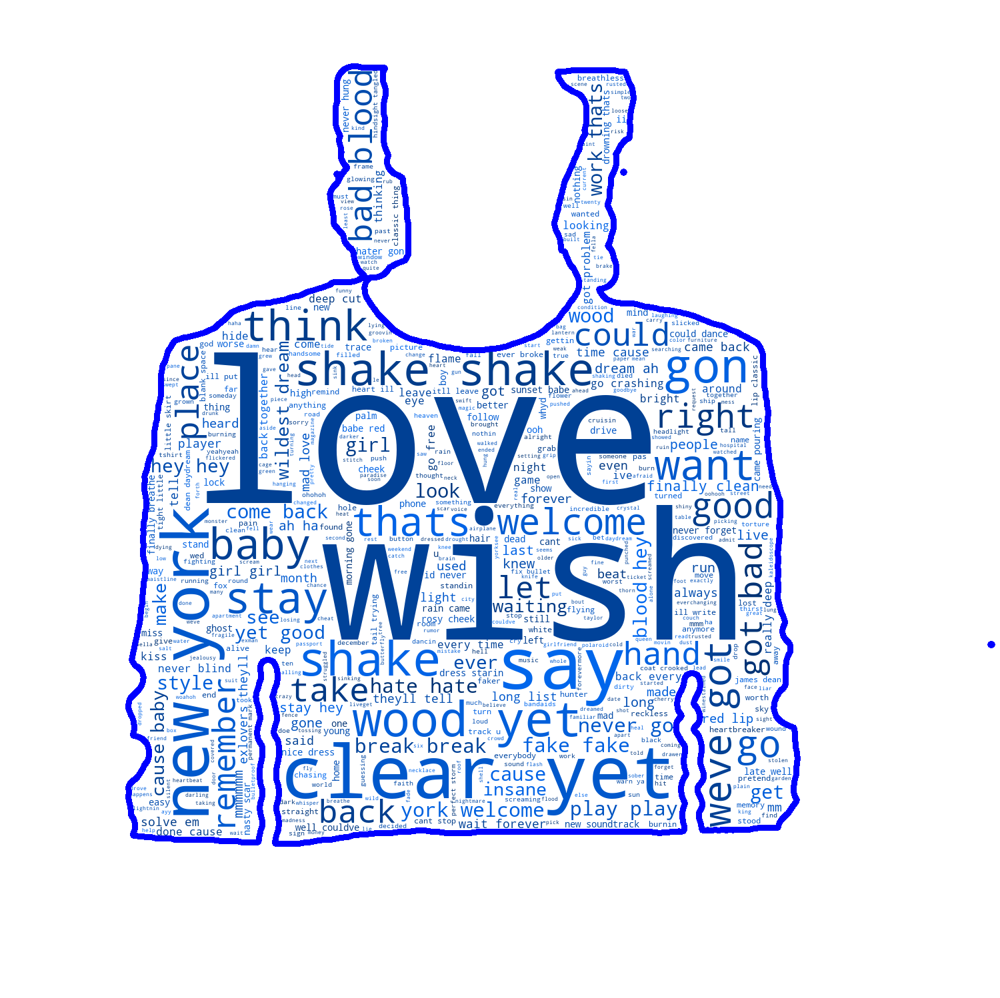

In [28]:
mask_89 = np.array(Image.open('1989.png'))

def col_89(word, font_size, position, orientation, font_path, random_state = None):
    h = 214
    s = 100
    l = int(100.0 * float(random_state.randint(60, 120)) / 255.0)

    return "hsl({}, {}%, {}%)".format(h, s, l)

word_cloud = WordCloud(mask = mask_89, stopwords = stopwordsList, contour_color = 'blue', contour_width = 15,
                       background_color = 'white', max_words = 1000).generate(lyrics_df.loc['1989']['lyrics'])

fig = px.imshow(word_cloud.recolor(color_func = col_89, random_state = 13))
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(showticklabels = False)


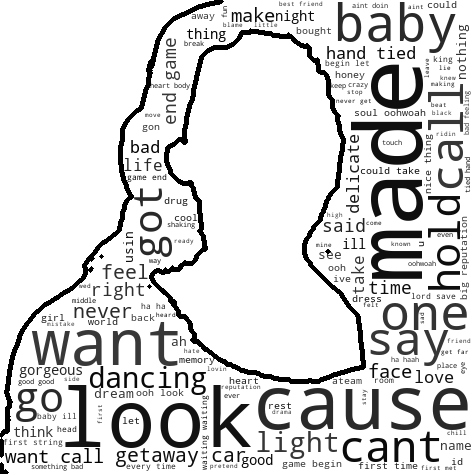

In [29]:
rep_mask = np.array(Image.open('reputation.png'))

def rep_col(word, font_size, position, orientation, font_path, random_state = None):
    h = int(360.0 * 0 / 255.0)
    s = int(100.0 * 0.0 / 255.0)
    l = int(100.0 * float(random_state.randint(0, 60)) / 255.0)

    return "hsl({}, {}%, {}%)".format(h, s, l)

word_cloud = WordCloud(mask = rep_mask, stopwords = stopwordsList, contour_color = '#000000',  contour_width = 6,
                       background_color = 'white', max_words = 1000).generate(lyrics_df.loc['reputation']['lyrics'])

fig = px.imshow(word_cloud.recolor(color_func = rep_col, random_state = 13))
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(showticklabels = False)


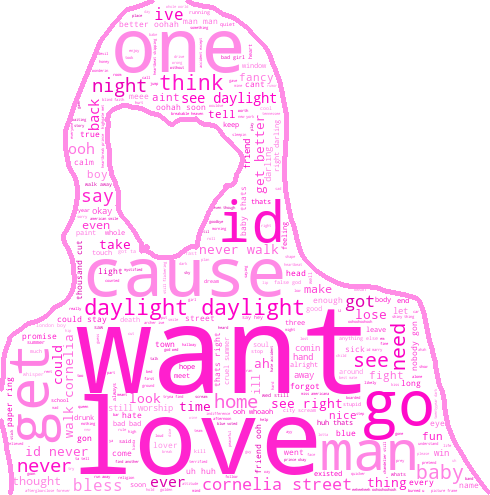

In [30]:
lover_mask = np.array(Image.open('lover.png'))

def lover_col(word, font_size, position, orientation, font_path, random_state = None):
    h = 313
    s = 100
    l = int(100.0 * float(random_state.randint(110, 200)) / 255.0)

    return "hsl({}, {}%, {}%)".format(h, s, l)

word_cloud = WordCloud(mask = lover_mask, stopwords = stopwordsList, contour_color = '#ff8ce6', contour_width = 6,
                       background_color = 'white', max_words = 1000).generate(lyrics_df.loc['Lover']['lyrics'])

fig = px.imshow(word_cloud.recolor(color_func = lover_col, random_state = 13))
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(showticklabels = False)


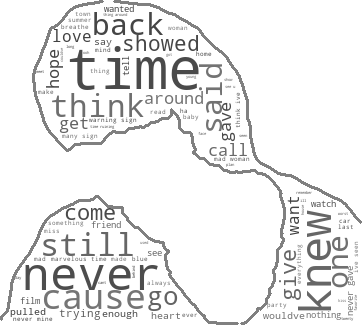

In [31]:
folk_mask = np.array(Image.open('folklore.png'))

def folk_col(word, font_size, position, orientation, font_path, random_state = None):
    h = 289
    s = 0
    l = int(100.0 * float(random_state.randint(60, 120)) / 255.0)

    return "hsl({}, {}%, {}%)".format(h, s, l)

word_cloud = WordCloud(mask = folk_mask, stopwords = stopwordsList, contour_color = 'gray', contour_width = 3,
                       background_color = 'white').generate(lyrics_df.loc['folklore']['lyrics'])

fig = px.imshow(word_cloud.recolor(color_func = folk_col, random_state = 13))
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(showticklabels = False)


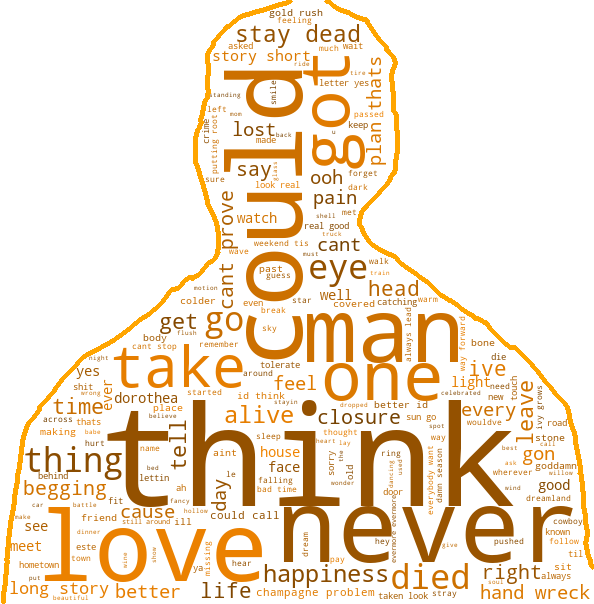

In [32]:
ever_mask = np.array(Image.open('evermore.png'))

def ever_col(word, font_size, position, orientation, font_path, random_state = None):
    h = 33
    s = 100
    l = int(100.0 * float(random_state.randint(60, 120)) / 255.0)

    return "hsl({}, {}%, {}%)".format(h, s, l)

word_cloud = WordCloud(mask = ever_mask, stopwords = stopwordsList, contour_color = 'orange', contour_width = 6,
                       background_color = 'white').generate(lyrics_df.loc['evermore']['lyrics'])

fig = px.imshow(word_cloud.recolor(color_func = ever_col, random_state = 13))
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(showticklabels = False)


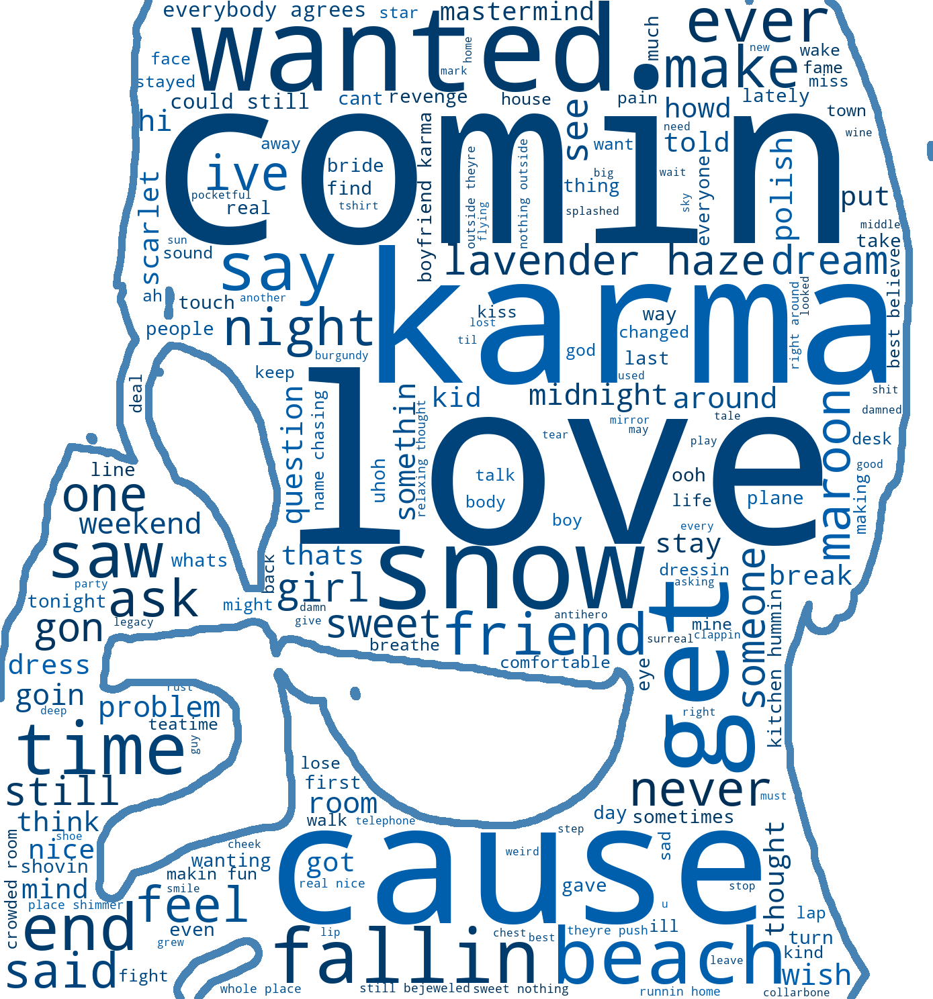

In [33]:
midnights_mask = np.array(Image.open('midnights2.png'))

def midnights_col(word, font_size, position, orientation, font_path, random_state = None):
    h = 207
    s = 100
    l = int(100.0 * float(random_state.randint(45, 90)) / 255.0)

    return "hsl({}, {}%, {}%)".format(h, s, l)

word_cloud = WordCloud(mask = midnights_mask, stopwords = stopwordsList, contour_color = 'steelblue', contour_width = 20,
                       background_color = 'white').generate(lyrics_df.loc['Midnights']['lyrics'])

fig = px.imshow(word_cloud.recolor(color_func = midnights_col, random_state = 13))
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(showticklabels = False)